In [2]:
import numpy as np
import random
import math
import pandas as pd
import plotly.express as px

from tqdm import tqdm

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:00<00:00, 126.26it/s]


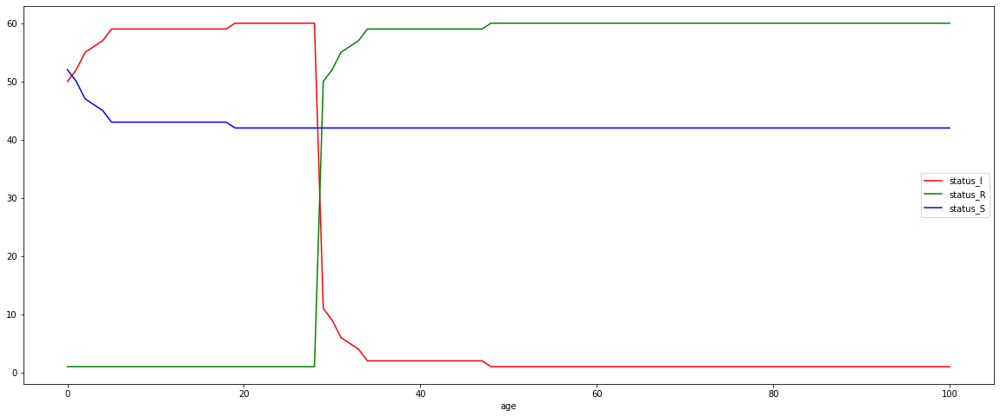

In [20]:
class Mensch:
    def __init__(self, x, y, uid, status='S'):# unique identifier uid
        self.x, self.y = x, y
        self.uid = uid
        self.status = status
        self.infected_time = 0 #Attribut default zero
        
    def update(self, max_infected_time=14):
        self.gehen(np.random.uniform(-1, 1), np.random.uniform(-1, 1))# da keine Variable dx/dy existent hier, muss ich Werte eingeben!
        if self.status == 'I':
            self.infected_time += 1
            if self.infected_time > max_infected_time:
                self.status = 'R' # Variable Status erhält neuen Wert, daher = !
    
    def gehen(self, dx, dy): # Delta x und y als Veränderung
        self.x, self.y = self.x+dx, self.y+dy # x oder y können größer oder kleiner als (-)100 sein an dieser Stelle !
        self.x = 100 if self.x > 100 else self.x # bedingte Variabelzuweisung
        self.x = -100 if self.x < -100 else self.x
        self.y = 100 if self.y > 100 else self.y
        self.y = -100 if self.y < -100 else self.y
        

class Stadt:
    def __init__(self, n, days, params):
        self.days = days
        self.params = params
        self.menschen = [Mensch(np.random.uniform(-100, 100), np.random.uniform(-100, 100), i, random.choice(['S', 'I'])) for i in range(n)]#wir arbeiten mit einer list comprehension
        self.dummies = [Mensch(-1002, 1000, -1), Mensch(-1002, 990, -2, status='I'), Mensch(-1002, 980, -3, status='R')]
        self.history = []
        self.age = 0
        self.save()
        self.update(n=self.days)
            
    def update(self, n=1): # neue Stadtmethode als Zeitschritt
        for _ in tqdm(range(n)): # wäre i, da esnciht genutzt wird nehmen wir Unterstrich (soll n mal genutzt werden)
            for mensch in self.menschen:
                mensch.update(max_infected_time=self.params[2])
                if mensch.status == 'S': # prüfen mit status 'S'
                    for mitmensch in self.menschen: # wir müssen hier die Laufvariable ändern 
                        if mensch.uid != mitmensch.uid:
                            distance = math.sqrt(((mitmensch.x-mensch.x)**2)+((mitmensch.y-mensch.y)**2))
                            if distance < self.params[0] and mitmensch.status == 'I': # hiernach muss es eine Warhscheinlichkeit der Infektion geben, daher random
                                r = random.random()
                                if r < self.params[1]:
                                    mensch.status = 'I'
                                    break
                            
            self.age += 1
            self.save()

            # Aufgabe: Mensch zufällig bewegen, in Werten zwischen -1 und 1 auch als floats!
            # Dann die Methode Update von außen aufrufen !
    
    def save(self):
        for mensch in self.menschen:
            self.history.append([self.age, mensch.x, mensch.y, mensch.uid, mensch.status])# muss eine liste in liste sein
        for mensch in self.dummies:
            self.history.append([self.age, mensch.x, mensch.y, mensch.uid, mensch.status])
    
    def show(self):
        df = pd.DataFrame(self.history, columns=['age', 'x', 'y', 'uid', 'status'])
        return px.scatter(df, x='x', y='y', color='status', color_discrete_map={'I': 'red', 'R': 'green', 'S': 'blue'}, animation_frame='age', animation_group='uid', range_x=[-105, 105], range_y=[-105, 105], width=1000, height=1000)
               
    def pplot(self):
        df = pd.DataFrame(self.history, columns=['age', 'x', 'y', 'uid', 'status'])
        df = pd.get_dummies(df, columns=['status'])
        df.groupby('age').sum()[['status_I', 'status_R', 'status_S']].plot(figsize=(20, 8), color=['red', 'green', 'blue'])
    
    def pprint(self): # p steht für pretty
        for mensch in self.menschen:
            print(mensch.x, mensch.y) # wir greifen auf die Laufvariable x und y über die Var mensch zu! mensch enthält ein Objekt vom Typ Mensch!
        
        
s = Stadt(100, 100, (5, 0.5, 28))# anzahl der menschen der Stadt wird übergeben! plus die Parameter
s.pplot()

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:07<00:00, 131.92it/s]


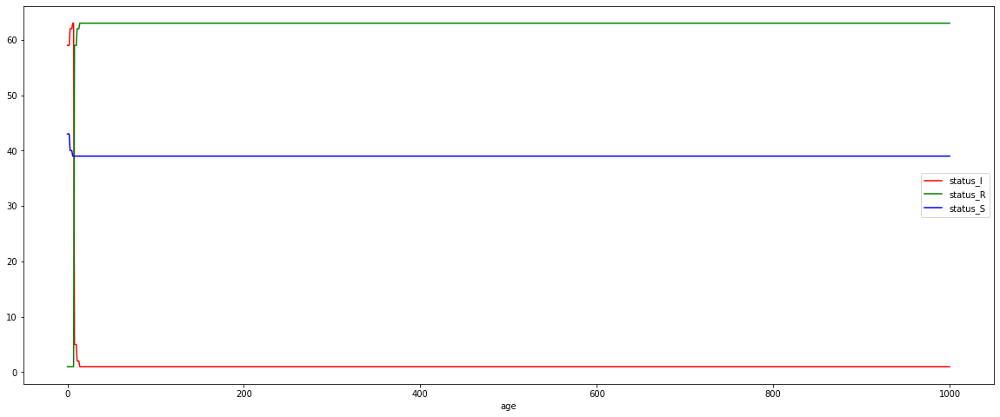

In [21]:
s = Stadt(100, 1000, (3, 0.3, 7))
s.pplot()

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:07<00:00, 141.60it/s]


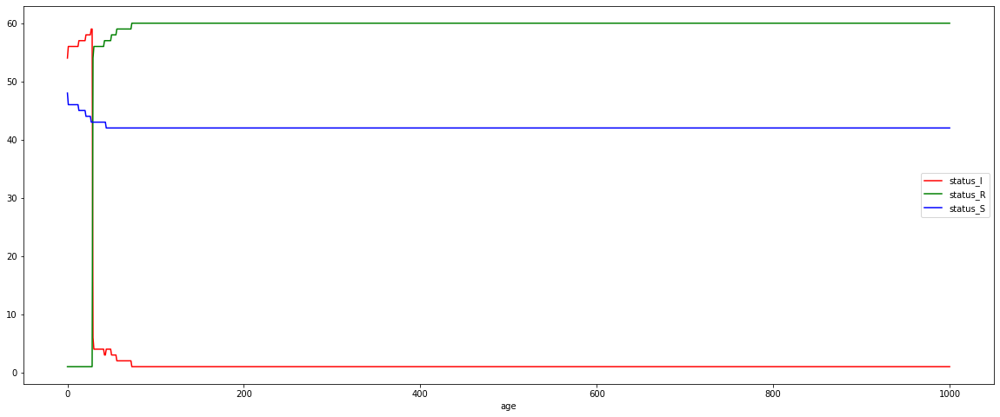

In [22]:
s = Stadt(100, 1000, (5, 0.8, 28))
s.pplot()

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:07<00:00, 135.01it/s]


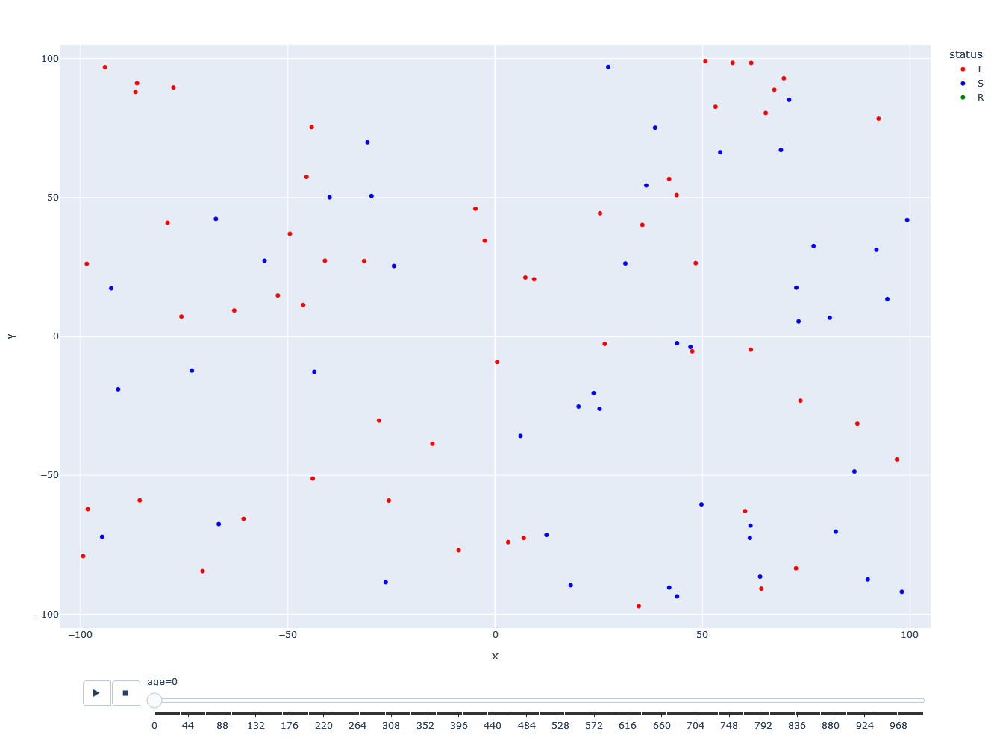

In [23]:
s = Stadt(100, 1000, (2, 1.0, 14))
s.show()

# mögliche Erweiterungen:

 - Grenze der Stadt einhalten [erledigt]
 
 - Menschen sollen 2 mögliche Attribute erhalten, kann infiziert od nicht oder kann tot sein od nicht, genesen oder nicht! => 3 verschiedene Werte für Attribut Status: S, I, R [erledigt]
 
 - Zufällige Zahl der Menschen werden initial infiziert sein, wenn sie aufeinander treffen wird es eine Wahrscheinlichkeit der Ansteckung geben
 
 - Ansteckung verringert sich nach Genesung (Dauer der Infektion 14 timesetps/ages o.ä.)
 
 - Wahrscheinlichkeit des Todes bei Infektion kommt hinzu, Mensch bleibt auf Karte ohne Bewegung und Aktion
 
 - Plot als 2 Linien (Anzahl Leute infiziert / nicht infiziert, Sehen/Tendenz wie es sich über Zeit verringert und die Bewegungen der Menschen) als Abschluss